In [1]:
import GWFish.modules as gw

from tqdm import tqdm
import matplotlib
import matplotlib.pyplot as plt
import corner
import numpy as np
import pandas as pd
import json
import os
from astropy.cosmology import Planck18
from scipy.integrate import quad
import astropy.units as u

import warnings
warnings.filterwarnings("ignore", "Wswiglal-redir-stdio")
import lal

GWFish_path = 'GWFish/'

/home/tobiazenbook/mambaforge/envs/igwn-py39/lib/python3.9/site-packages/lalsimulation/lalsimulation.py:8: UserWarning: Wswiglal-redir-stdio:

SWIGLAL standard output/error redirection is enabled in IPython.
This may lead to performance penalties. To disable locally, use:

with lal.no_swig_redirect_standard_output_error():
    ...

To disable globally, use:

lal.swig_redirect_standard_output_error(True)

Note however that this will likely lead to error messages from
LAL functions being either misdirected or lost when called from
Jupyter notebooks.

To suppress this warning, use:

import warnings
warnings.filterwarnings("ignore", "Wswiglal-redir-stdio")
import lal

  import lal
/home/tobiazenbook/mambaforge/envs/igwn-py39/lib/python3.9/site-packages/pandas/core/computation/expressions.py:21: UserWarning: Pandas requires version '2.8.4' or newer of 'numexpr' (version '2.7.3' currently installed).
  from pandas.core.computation.check import NUMEXPR_INSTALLED


# General functions for utilities

In [2]:
from datetime import datetime, timedelta

def gps_to_utc(gps_time):
    ''' This function converts UTC time to GPS time. The GPS time is defined as the number of seconds from the 6 January of 1980.
    '''
    gps_epoch = datetime(1980, 1, 6)
    utc_time = gps_epoch + timedelta(seconds=gps_time)
    return utc_time

# example:
#gps_time = 1234567890  #UTC time to convert
#utc_time = gps_to_utc(gps_time)
#print("UTC Time:", utc_time)


def utc_to_gps(utc_time):
    ''' This function converts GPS time to UTC time . The GPS time is defined as the number of seconds from the 6 January of 1980.
    '''
    gps_epoch = datetime(1980, 1, 6)
    gps_time = (utc_time - gps_epoch).total_seconds()
    return gps_time

# example:
#utc_time = datetime(2024, 3, 11, 12, 0, 0)  # UTC time to convert
#gps_time = utc_to_gps(utc_time)
#print("GPS Time:", gps_time)

## 1) Global settings

In [24]:
single_events_path='/home/tobiazenbook/Desktop/JOB/TOOLS/GWFish/GWFish/NSBH_results_single_events'

if not os.path.exists(single_events_path):
    os.makedirs(single_events_path)

In [6]:

population = 'NSBH' # It is just a name 

# The detector names can be accessed in detectors.yaml file
# One can list as many detectors as they want: ['LHO', 'LLO', 'VIR', 'CE1', 'CE2', 'ET']

detector_ligo_virgo = ['LHO','LLO','VIR']
detector_ligo=['LHO','LLO']
detector_virgo=['VIR']
detector_ET_CE1 = ['CE1','ET']
detector_ET = ['ET']

# The detection_SNR is the minimum SNR for a detection:
#   --> The first entry specifies the minimum SNR for a detection in a single detector
#   --> The second entry specifies the minimum network SNR for a detection

network_ligo_virgo = gw.detection.Network(detector_ids = detector_ligo_virgo, detection_SNR = (0., 8.))
network_ligo = gw.detection.Network(detector_ids = detector_ligo, detection_SNR = (0., 8.))
network_virgo = gw.detection.Network(detector_ids = detector_virgo, detection_SNR = (0., 8.))
network_CE1_ET = gw.detection.Network(detector_ids = detector_ET_CE1, detection_SNR = (0., 8.))
network_ET = gw.detection.Network(detector_ids = detector_ET, detection_SNR = (0., 8.))

#-------------------------------------------------------------------------------------------------------------------------
selected_network=network_ligo_virgo
#-------------------------------------------------------------------------------------------------------------------------

ConfigDet = os.path.join(GWFish_path,'detectors.yaml')

calculate_errors = True
duty_cycle = True

#waveform_model = 'IMRPhenomD_NRTidalv2'
NSBH_waveform = 'IMRPhenomNSBH'
#NSBH_waveform ='SEOBNRv4_ROM_NRTidalv2_NSBH'

waveform_class = gw.waveforms.LALFD_Waveform

In [8]:
#------------------------------------------ Injected parameters -------------------------------------------------------------------

z = np.array([0.07]) #redshift

luminosity_distance= Planck18.luminosity_distance(z).value
print(f"luminosity_distance: {luminosity_distance}")

NSBH_parameters = {
    'redshift': z,
    'mass_1': np.array([6.5]), 
    'mass_2': np.array([1.4]), 
    #'luminosity_distance': Planck18.luminosity_distance(z).value,
    'luminosity_distance': luminosity_distance,
    'theta_jn': np.array([2.5]),
    'ra': np.array([3.4]),
    'dec': np.array([-0.4]),
    'psi': np.array([0.]),
    'phase': np.array([0.]),
    'geocent_time': np.array([1388102400.0]),
    'a_1':np.array([0.33]), 
    'a_2':np.array([0.01]),
    'lambda_1':np.array([1]), 
    'lambda_2':np.array([2000])
    }
NSBH_parameters = pd.DataFrame(NSBH_parameters)
display(NSBH_parameters)

#--------- The fisher parameters are the parameters that will be used to calculate the Fisher matrix and on which we will calculate the errors ----------

fisher_NSBH_parameters = [  'redshift',
                            'mass_1',
                            'mass_2',
                            'luminosity_distance', 
                            'theta_jn',
                            'ra',
                            'dec',
                            'psi', 
                            'phase',
                            'geocent_time',
                            'a_1',
                            'a_2',
                            'lambda_1',
                            'lambda_2']

luminosity_distance: [326.38115815]


,redshift,mass_1,mass_2,luminosity_distance,theta_jn,ra,dec,psi,phase,geocent_time,a_1,a_2,lambda_1,lambda_2
0,0.07,6.5,1.4,326.381158,2.5,3.4,-0.4,0.0,0.0,1.388102e+09,0.33,0.01,1,2000


### 2) Compute Fisher Matrix and network errors

In [10]:

detected, network_snr, parameter_errors, sky_localization = gw.fishermatrix.compute_network_errors(
        network = selected_network,
        parameter_values = NSBH_parameters,
        fisher_parameters=fisher_NSBH_parameters, 
        waveform_model = NSBH_waveform,
        use_duty_cycle = True,   # default is False anyway
        save_matrices = True, # default is False anyway
        save_matrices_path = single_events_path, # default is None anyway, otherwise specify the folder where to save the Fisher and corresponding covariance matrices
        matrix_naming_postfix= 'z_0.07',

)
print(detected)            

gw.fishermatrix.output_to_txt_file(parameter_values=NSBH_parameters,
                                   network_snr=network_snr,
                                   parameter_errors=parameter_errors,
                                   sky_localization=sky_localization,
                                   fisher_parameters=fisher_NSBH_parameters,
                                   filename=single_events_path+"/errors_z_0-07",)

100%|██████████| 1/1 [00:32<00:00, 32.15s/it]

[0]


### 3) Print Sky localization, parameters errors and plot the signal

In [20]:
print(f'The network of SNR of {selected_network.name} the event is ', network_snr)
print(f'The sky localization of the event for the network {selected_network.name} is ', sky_localization)

# Choose percentile factor of sky localization and pass from rad2 to deg2
percentile = 90.
sky_localization_90cl = sky_localization * gw.fishermatrix.sky_localization_percentile_factor(percentile)
print(f"Localization area: {sky_localization_90cl} deg^2")

The network of SNR of LHO_LLO_VIR the event is  [51.22316457]
The sky localization of the event for the network LHO_LLO_VIR is  [0.00012517]
Localization area: [1.89228375] deg^2


In [21]:
# One can create a dictionary with the parameter errors, the order is the same as the one given in fisher_parameters

parameter_errors_dict = {}
for i, parameter in enumerate(fisher_NSBH_parameters):
    parameter_errors_dict['err_' + parameter] = np.squeeze(parameter_errors)[i]


print('The parameter errors of the event are ')
display(parameter_errors_dict)


errors = pd.read_csv(single_events_path + '/' + 'errors_z_0-07.txt', delimiter = ' ')
display(errors)

The parameter errors of the event are 


{'err_redshift': 0.6533167794605441,
 'err_mass_1': 5.343334092470038,
 'err_mass_2': 2.3834057005192735,
 'err_luminosity_distance': 122.19388200114484,
 'err_theta_jn': 0.5565996451115517,
 'err_ra': 0.005801479885794894,
 'err_dec': 0.007766222718848543,
 'err_psi': 1.2055081045267655,
 'err_phase': 2.5175463666000244,
 'err_geocent_time': 0.002591895050529456,
 'err_a_1': 1.6375798627243856,
 'err_a_2': 4.387918074406258,
 'err_lambda_1': 208.59430353607792,
 'err_lambda_2': 4335.5145201348805}

,network_SNR,redshift,mass_1,mass_2,luminosity_distance,theta_jn,ra,dec,psi,phase,...,err_ra,err_dec,err_psi,err_phase,err_geocent_time,err_a_1,err_a_2,err_lambda_1,err_lambda_2,err_sky_location
0,51.223165,0.07,6.5,2.8,326.4,2.5,3.4,-0.4,0.0,0.0,...,0.005801,0.007766,1.206,2.518,0.002592,1.638,4.388,208.6,4336.0,0.000125


5000
5000


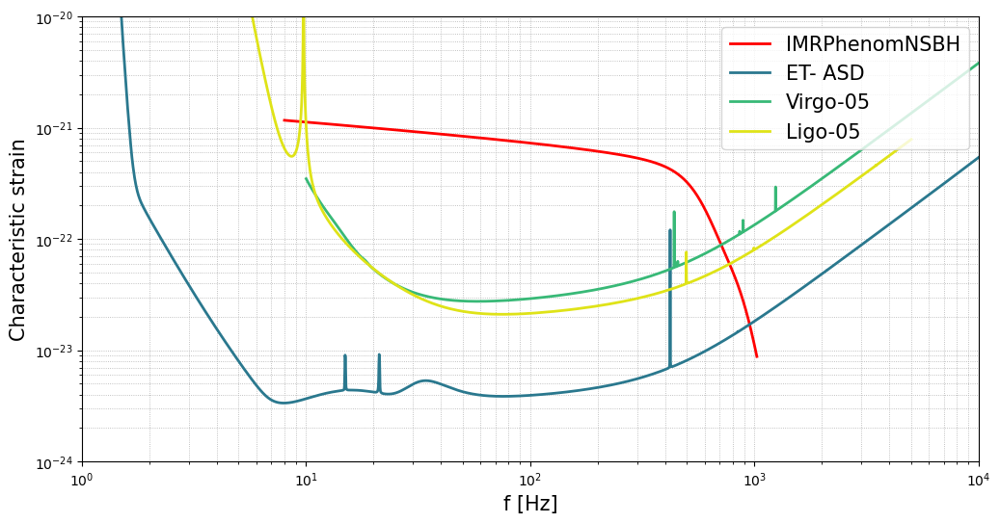

In [22]:
# The waveform model can be accessed through the waveform_class attribute,
# which requires the waveform_model and the data_params and the parameters of the event

waveform_class = gw.waveforms.LALFD_Waveform


data_params={
        'frequencyvector': selected_network.detectors[0].frequencyvector,
        'f_ref': 50.
        }

waveform_obj = waveform_class(NSBH_waveform, NSBH_parameters.iloc[0], data_params)
wave = waveform_obj()
t_of_f = waveform_obj.t_of_f


#------- The waveform is then projected onto the detector taking into account the Earth rotation 
#------- by passing at each frequency step the time of the waveform at the detector

#signal = gw.detection.projection(parameters.iloc[0],selected_network.detectors[0], wave, t_of_f)

# The projected amplitude is stored in the signal variable We have 3 columns as ET is made of 3 detectors
#signal1, signal2, signal3 = signal[:, 0], signal[:, 1], signal[:, 2]


signal1= gw.detection.projection(NSBH_parameters.iloc[0], selected_network.detectors[0], wave, t_of_f)
signal2= gw.detection.projection(NSBH_parameters.iloc[0], network_ligo_virgo.detectors[1], wave, t_of_f)
signal3= gw.detection.projection(NSBH_parameters.iloc[0], network_ligo_virgo.detectors[2], wave, t_of_f)


signal_ampl = np.sqrt(np.abs(signal1)**2. + np.abs(signal2)**2. + np.abs(signal3)**2.)
print(len(signal_ampl))
print(signal_ampl.size)

# The PSD of the ET-D detector is stored in the detector_psd folder
# We need to specify the path to the file
GWFish_path = '/home/tobiazenbook/Desktop/JOB/TOOLS/GWFish/GWFish/' 
psd_et = np.loadtxt(os.path.join(GWFish_path,'detector_psd/ET_psd.txt'), usecols=[0,1])
psd_virgo05 = np.loadtxt(os.path.join(GWFish_path,'detector_psd/Virgo_O5_psd.txt'), usecols=[0,1])
psd_Ligo05 = np.loadtxt(os.path.join(GWFish_path,'detector_psd/LIGO_O5_psd.txt'), usecols=[0,1])

frequencyvector = selected_network.detectors[0].frequencyvector # for ligo-virgo
#frequencyvector = selected_network.detectors[0].frequencyvector[:, 0] # for ET, why?

# plot -----------------------------------------------------------------------------------------------------------------------------------------------

# default,classic, bmh, dark_background, fivethirtyeight,ggplot, grayscale, seaborn-colorblind, seaborn-dark, seaborn-dark-palette,seaborn-darkgrid
# seaborn-deep, seaborn-muted,seaborn-notebook,seaborn-paper,seaborn-pastel,seaborn-poster,seaborn-poster,seaborn-talk,seaborn-ticks,seaborn-white,seaborn-whitegrid

plt.style.use('default')
fig, ax = plt.subplots(figsize=(12,6))

colors= plt.colormaps['viridis'](np.linspace(0.4, 0.95, 3))
#plt.cm.viridis, 

ax.plot(frequencyvector, 2. * frequencyvector * signal_ampl, linewidth=2., label='%s' %(NSBH_waveform),color="red")

ax.plot(psd_et[:,0], np.sqrt(psd_et[:,0]) * np.sqrt(psd_et[:,1]), linewidth = 2.0, color = colors[0], label = 'ET- ASD')
ax.plot(psd_virgo05[:,0], np.sqrt(psd_virgo05[:,0]) * np.sqrt(psd_virgo05[:,1]), linewidth = 2.0, color=colors[1], label = 'Virgo-05')
ax.plot(psd_Ligo05[:,0], np.sqrt(psd_Ligo05[:,0]) * np.sqrt(psd_Ligo05[:,1]), linewidth = 2.0, color= colors[2], label = 'Ligo-05')

#ax.set_xlim(1.,frequencyvector[-1])
ax.set_xlim(1.,1e4)
ax.set_ylim(1e-24, 1e-20)
ax.set_xscale('log')
ax.set_yscale('log')
ax.set_xlabel('f [Hz]', fontsize=15)
ax.set_ylabel(r'Characteristic strain', fontsize=15)
plt.grid(linestyle='dotted', linewidth='0.6', which='both')
ax.legend(loc='upper right', fontsize=15, ncol=1, fancybox=True)

plt.show()

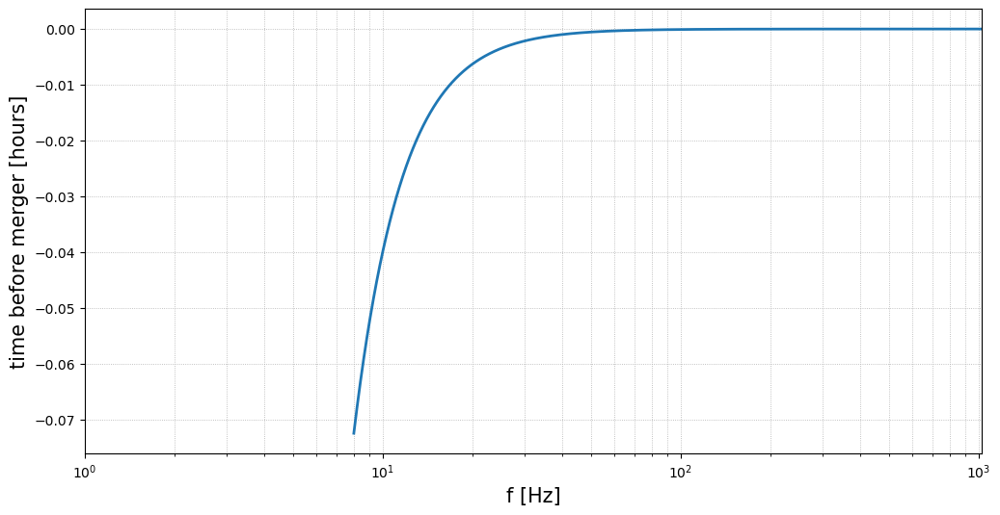

In [23]:
# Plot the time before merger as a function of frequency
fig, ax = plt.subplots(figsize = (12,6))
conv_to_hours = 3600
ax.plot(frequencyvector, (t_of_f - NSBH_parameters['geocent_time'].iloc[0]) / conv_to_hours, linewidth = 2.)

ax.set_xlim(1.,frequencyvector[-1])
ax.set_xscale('log')
ax.set_xlabel('f [Hz]', fontsize = 15)
ax.set_ylabel(r'time before merger [hours]', fontsize=15)
plt.grid(linestyle = 'dotted', linewidth = '0.6', which = 'both')

plt.show()

## Usage of sub network lists and "analyze_and_save_to_txt" function


In [4]:
multiple_networks = gw.detection.Network(detector_ids = ['LHO', 'LLO', 'VIR', 'CE1', 'ET'], detection_SNR = (0., 8.))
sub_network_list = [[0, 1, 2], [3, 4], [4]] 

 
for sub_network_ids in sub_network_list:

        partial_network = multiple_networks.partial(sub_network_ids)
        
        print(f"Partial Network name: {partial_network.name}")

        filename = gw.fishermatrix.errors_file_name(
            network=multiple_networks,
            sub_network_ids=sub_network_ids,
            population_name=population,
        )
        
        print(f"Errors filename: {filename}")
        print()
        

Partial Network name: LHO_LLO_VIR
Errors filename: Errors_LHO_LLO_VIR_NSBH_SNR8

Partial Network name: CE1_ET
Errors filename: Errors_CE1_ET_NSBH_SNR8

Partial Network name: ET
Errors filename: Errors_ET_NSBH_SNR8



In [9]:
multiple_networks = gw.detection.Network(detector_ids = ['LHO', 'LLO', 'VIR', 'CE1', 'ET'], detection_SNR = (0., 8.))
sub_network_list = [[0, 1, 2], [3, 4], [4]]

gw.fishermatrix.analyze_and_save_to_txt(network = multiple_networks,
                                        parameter_values  = NSBH_parameters,
                                        fisher_parameters = fisher_NSBH_parameters, 
                                        sub_network_ids_list = sub_network_list,
                                        population_name = 'NSBH',
                                        waveform_model = NSBH_waveform,
                                        save_path = single_events_path,
                                        save_matrices = True,
                                      )

100%|██████████| 1/1 [00:10<00:00, 10.38s/it]


In [27]:

m=np.linspace(1.1,2.6,100)
    
for mass_2 in m:
    
    print(f"NS mass: {mass_2}")
    
    NSBH_parameters = {
        'redshift': z,
        'mass_1': np.array([6.5]), 
        'mass_2': np.array([mass_2]), 
        #'luminosity_distance': Planck18.luminosity_distance(z).value,
        'luminosity_distance': luminosity_distance,
        'theta_jn': np.array([2.5]),
        'ra': np.array([3.4]),
        'dec': np.array([-0.4]),
        'psi': np.array([0.]),
        'phase': np.array([0.]),
        'geocent_time': np.array([1388102400.0]),
        'a_1':np.array([0.33]), 
        'a_2':np.array([0.01]),
        'lambda_1':np.array([1]), 
        'lambda_2':np.array([2000])
        }
    NSBH_parameters = pd.DataFrame(NSBH_parameters)
    
    multiple_networks = gw.detection.Network(detector_ids = ['LHO', 'LLO', 'VIR', 'CE1', 'ET'], detection_SNR = (0., 8.))
    sub_network_list = [[0, 1, 2], [3, 4], [4]]

    gw.fishermatrix.analyze_and_save_to_txt(network = multiple_networks,
                                            parameter_values  = NSBH_parameters,
                                            fisher_parameters = fisher_NSBH_parameters, 
                                            sub_network_ids_list = sub_network_list,
                                            population_name = 'NSBH',
                                            waveform_model = NSBH_waveform,
                                            save_path = single_events_path,
                                            save_matrices = True,
                                        )

NS mass: 1.1


100%|██████████| 1/1 [00:12<00:00, 12.39s/it]


NS mass: 1.1151515151515152


100%|██████████| 1/1 [00:11<00:00, 11.54s/it]


NS mass: 1.1303030303030304


100%|██████████| 1/1 [00:10<00:00, 10.59s/it]


NS mass: 1.1454545454545455


100%|██████████| 1/1 [00:10<00:00, 10.50s/it]


NS mass: 1.1606060606060606


100%|██████████| 1/1 [00:10<00:00, 10.55s/it]


NS mass: 1.1757575757575758


100%|██████████| 1/1 [00:10<00:00, 10.51s/it]


NS mass: 1.190909090909091


100%|██████████| 1/1 [00:10<00:00, 10.57s/it]


NS mass: 1.206060606060606


100%|██████████| 1/1 [00:10<00:00, 10.45s/it]


NS mass: 1.2212121212121212


100%|██████████| 1/1 [00:10<00:00, 10.59s/it]


NS mass: 1.2363636363636363


100%|██████████| 1/1 [00:10<00:00, 10.46s/it]


NS mass: 1.2515151515151517


100%|██████████| 1/1 [00:10<00:00, 10.42s/it]


NS mass: 1.2666666666666668


100%|██████████| 1/1 [00:10<00:00, 10.45s/it]


NS mass: 1.281818181818182


100%|██████████| 1/1 [00:10<00:00, 10.40s/it]


NS mass: 1.296969696969697


100%|██████████| 1/1 [00:10<00:00, 10.79s/it]


NS mass: 1.3121212121212122


100%|██████████| 1/1 [00:10<00:00, 10.59s/it]


NS mass: 1.3272727272727274


100%|██████████| 1/1 [00:11<00:00, 11.00s/it]


NS mass: 1.3424242424242425


100%|██████████| 1/1 [00:10<00:00, 10.57s/it]


NS mass: 1.3575757575757577


100%|██████████| 1/1 [00:10<00:00, 10.78s/it]


NS mass: 1.3727272727272728


100%|██████████| 1/1 [00:12<00:00, 12.09s/it]


NS mass: 1.387878787878788


100%|██████████| 1/1 [00:15<00:00, 15.25s/it]


NS mass: 1.403030303030303


100%|██████████| 1/1 [00:15<00:00, 15.13s/it]


NS mass: 1.4181818181818182


100%|██████████| 1/1 [00:12<00:00, 12.55s/it]


NS mass: 1.4333333333333336


  0%|          | 0/1 [00:00<?, ?it/s]

In [13]:
errors1 = pd.read_csv(single_events_path + '/' + 'Errors_ET_NSBH_SNR8.txt', delimiter = ' ')
errors2 = pd.read_csv(single_events_path + '/' + 'Errors_CE1_ET_NSBH_SNR8.txt', delimiter = ' ')
errors3 = pd.read_csv(single_events_path + '/' + 'Errors_LHO_LLO_VIR_NSBH_SNR8.txt', delimiter = ' ')

#print(errors1.keys())
display(errors1)
display(errors2)
display(errors3)

,network_SNR,redshift,mass_1,mass_2,luminosity_distance,theta_jn,ra,dec,psi,phase,...,err_ra,err_dec,err_psi,err_phase,err_geocent_time,err_a_1,err_a_2,err_lambda_1,err_lambda_2,err_sky_location
0,139.902593,0.07,6.5,1.4,326.4,2.5,3.4,-0.4,0.0,0.0,...,0.03134,0.02738,1.246,2.593,0.001176,0.1368,0.7951,10.53,569.9,0.002467


,network_SNR,redshift,mass_1,mass_2,luminosity_distance,theta_jn,ra,dec,psi,phase,...,err_ra,err_dec,err_psi,err_phase,err_geocent_time,err_a_1,err_a_2,err_lambda_1,err_lambda_2,err_sky_location
0,293.858221,0.07,6.5,1.4,326.4,2.5,3.4,-0.4,0.0,0.0,...,0.0038,0.006019,0.2762,0.4704,0.0006,0.07653,0.4452,6.444,387.7,0.000046


,network_SNR,redshift,mass_1,mass_2,luminosity_distance,theta_jn,ra,dec,psi,phase,...,err_ra,err_dec,err_psi,err_phase,err_geocent_time,err_a_1,err_a_2,err_lambda_1,err_lambda_2,err_sky_location
0,37.544109,0.07,6.5,1.4,326.4,2.5,3.4,-0.4,0.0,0.0,...,0.006466,0.008623,1.535,3.438,0.005045,0.8846,4.834,65.48,2193.0,0.000157


In [28]:
fisher_matrix = np.load(single_events_path + '/' + 'fisher_matrices_ET_NSBH_SNR8.npy')

my_fisher = fisher_matrix[0, :, :]
print('We expect Delta dL/dL to scale as 1/SNR')
print('fisher matrix dL-dL: ', my_fisher[3, 3])
print('(SNR/dL)^2: ', (errors1['network_SNR'].iloc[0] / errors1['luminosity_distance'].iloc[0])**2)

We expect Delta dL/dL to scale as 1/SNR
fisher matrix dL-dL:  0.3409400625138977
(SNR/dL)^2:  0.34090070125867317


### Corner plots

In [10]:
CORNER_KWARGS = dict(
    bins = 50, # number of bins for histograms
    smooth = 0.99, # smooths out contours. 
    plot_datapoints = True, # choose if you want datapoints
    label_kwargs = dict(fontsize = 12), # font size for labels
    show_titles = True, #choose if you want titles on top of densities.
    title_kwargs = dict(fontsize = 12), # font size for title
    plot_density = False,
    title_quantiles = [0.16, 0.5, 0.84],  # add quantiles to plot densities for 1d hist
    levels = (1 - np.exp(-0.5), 1 - np.exp(-2), 1 - np.exp(-9 / 2.)), # 1, 2 and 3 sigma contours for 2d plots
    fill_contours = True, #decide if you want to fill the contours
    max_n_ticks = 2, # set a limit to ticks in the x-y axes.
    title_fmt=".3f"
    )

#### 1) Full parameters 

In [11]:
corner_labels = ['z',r'$m_1$ $[M_{\odot}]$', '$m_2$ $[M_{\odot}]$', '$D_l$ [Mpc]', '$\iota$ [rad]', '$RA$ [rad]','$DEC$ [rad]', '$\Psi$ [rad]',
              '$phase$', '$t_c$', '$a_1$', '$a_2$', '$\Lambda_1$', '$\Lambda_2$']

mean_labels = [ 'redshift','mass_1','mass_2','luminosity_distance', 'theta_jn','ra','dec','psi', 'phase','geocent_time','a_1','a_2','lambda_1','lambda_2']

#------------------ I can take the means from the reference parameters or from error file ------------------------

mean_values = NSBH_parameters[mean_labels].iloc[0] # mean values of the parameters
#means0 = errors1[mean_labels]
#means1=errors1[mean_labels].iloc[0]


cov_matrix=np.load(single_events_path + '/' + 'inv_fisher_matrices_ET_NSBH_SNR8.npy')[0, :,:]

# Sample from a multi-variate gaussian with the given covariance matrix and injected mean values
number_of_samples = 1e6 
samples = np.random.multivariate_normal(mean_values, cov_matrix, int(number_of_samples))

#samples = np.random.multivariate_normal(mean_values, np.squeeze(cov_matrix), int(number_of_samples))

/tmp/ipykernel_20103/4162631971.py:17: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  samples = np.random.multivariate_normal(mean_values, cov_matrix, int(number_of_samples))


### Plot

/home/tobiazenbook/mambaforge/envs/igwn-py39/lib/python3.9/site-packages/corner/core.py:841: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  if xs[k1] is not None:
/home/tobiazenbook/mambaforge/envs/igwn-py39/lib/python3.9/site-packages/corner/core.py:842: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  axes[k1, k1].axvline(xs[k1], **kwargs)
/home/tobiazenbook/mambaforge/envs/igwn-py39/lib/python3.9/site-packages/corner/core.py:844: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access 

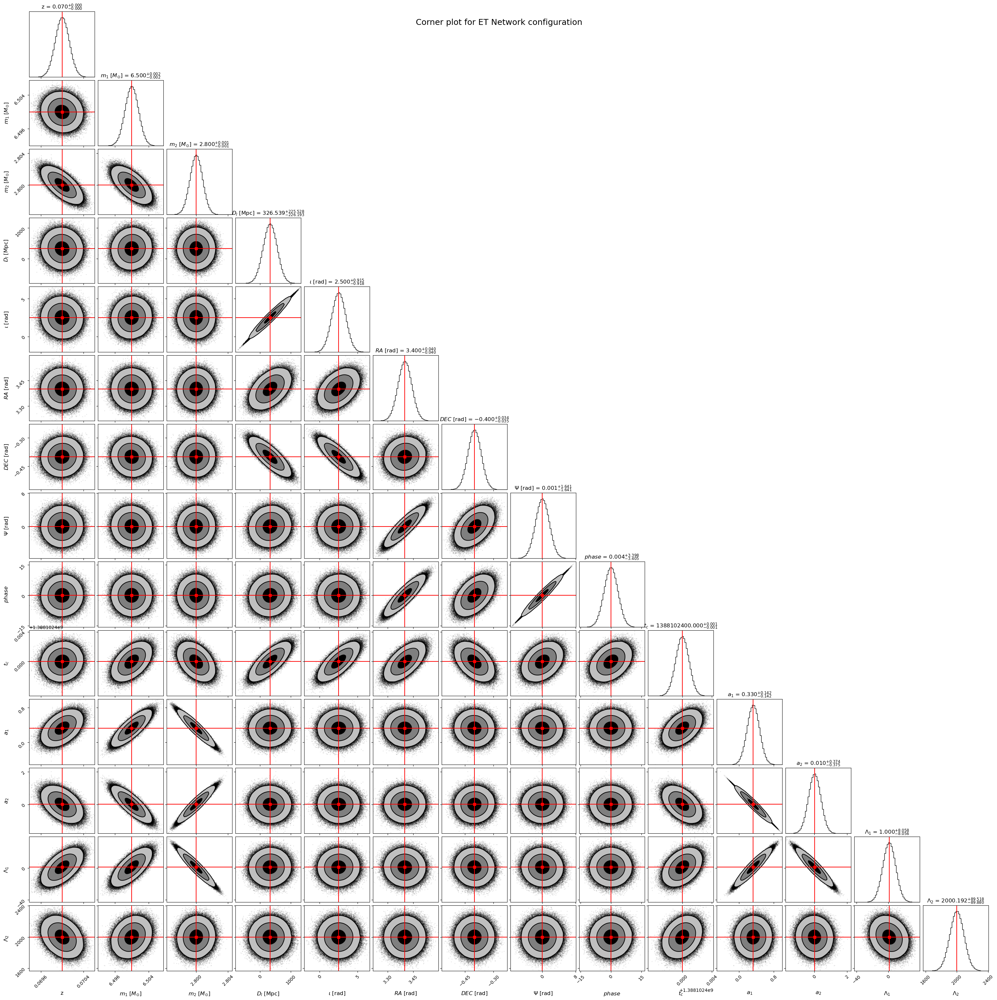

In [33]:

fig = corner.corner(samples, labels = corner_labels, truths = mean_values, truth_color = 'red', **CORNER_KWARGS)
fig.suptitle("Corner plot for ET Network configuration",fontsize=18)
plt.show()

### 2) Full parameters + priors

In [14]:

# Take the corresponding columns to create the vector of mean values
# List the parameters as they appear in the covariance matrix (it is the same order of the err_<param_name> columns in Errors.txt file)

means = errors1[mean_labels]
#means1=errors1[mean_lbs].iloc[0]

# Store the value of the total number of events and  of the number of parameters considered for each event
number_events = len(means)
print(number_events)

number_parameters = len(mean_labels)
print(number_parameters)

if ('ra' in mean_labels) and ('dec' in mean_labels):
    sky_localization = np.zeros((number_events,)) #new vector for sky localization
    
    #Store the index number where 'ra' and 'dec' are to calculate the new sky localization
    idx_ra = mean_labels.index('ra')
    idx_dec = mean_labels.index('dec')

1
14


#### Mass distribution function

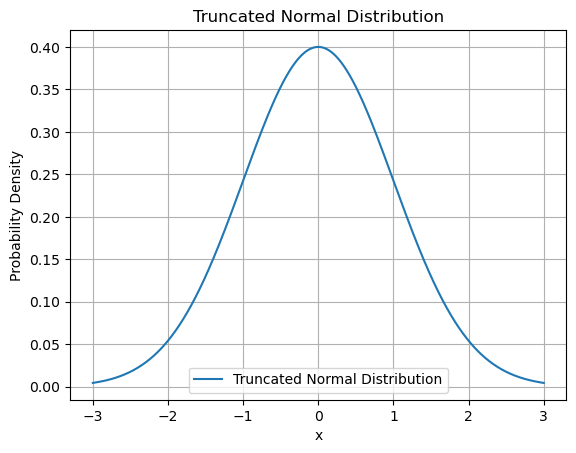

In [15]:
from scipy.stats import truncnorm
import numpy as np
import matplotlib.pyplot as plt

def plot_truncated_normal(mean, std_dev, lower_bound, upper_bound):
    # Definisci la distribuzione troncata
    a = (lower_bound - mean) / std_dev
    b = (upper_bound - mean) / std_dev
    x = np.linspace(lower_bound, upper_bound, 1000)
    y = truncnorm.pdf(x, a, b, loc=mean, scale=std_dev)

    # Disegna il grafico della distribuzione
    plt.plot(x, y, label='Truncated Normal Distribution')
    plt.title('Truncated Normal Distribution')
    plt.xlabel('x')
    plt.ylabel('Probability Density')
    plt.legend()
    plt.grid(True)
    plt.show()

# Esempio di utilizzo
mean = 0
std_dev = 1
lower_bound = -3
upper_bound = 3

plot_truncated_normal(mean, std_dev, lower_bound, upper_bound)


In [16]:
from scipy.stats import truncnorm

def BH_distribution_function():
    
    def truncated_normal(mean, std_dev, lower_bound, upper_bound, size):
        a = (lower_bound - mean) / std_dev
        b = (upper_bound - mean) / std_dev
        return truncnorm.rvs(a, b, loc=mean, scale=std_dev, size=size)

    # BH mass distribution parameters 
    BH_mean = 15
    BH_std_dev = 10
    BH_lower_bound = 3.1
    BH_upper_bound = 55

# NS mass distribution parameters 
NS_mean = 1.4
NS_std_dev = 0.3
NS_lower_bound = 1.1
NS_upper_bound = 2.1

def mass_prior(samples, min_BH_value = 3.1, max_BH_value=55.0,min_NS_value = 1.1,max_NS_value=2.4):
    lower_m1 = samples['mass_1'] > min_BH_value
    upper_m1 = samples['mass_1'] < max_BH_value
    mask_m1  = np.logical_and(lower_m1, upper_m1)
    
    lower_m2 = samples['mass_2'] > min_NS_value
    upper_m2 = samples['mass_2'] < max_NS_value
    mask_m2  = np.logical_and(lower_m2, upper_m2)
    
    return np.logical_and(mask_m1, mask_m2)



In [17]:
# uniform mass prior

def mass_prior(samples, min_BH_value = 3.1, max_BH_value=55.0,min_NS_value = 1.1,max_NS_value=2.9):
    lower_m1 = samples['mass_1'] > min_BH_value
    upper_m1 = samples['mass_1'] < max_BH_value
    mask_m1  = np.logical_and(lower_m1, upper_m1)
    
    lower_m2 = samples['mass_2'] > min_NS_value
    upper_m2 = samples['mass_2'] < max_NS_value
    mask_m2  = np.logical_and(lower_m2, upper_m2)
    
    return np.logical_and(mask_m1, mask_m2)

#### Priors settings

In [19]:
import warnings
warnings.filterwarnings("ignore")

# Create samples dataframe to pass through priors masks
data_samples = {'redshift':samples[:, 0],
                'mass_1':samples[:, 1],
                'mass_2':samples[:, 2],
                'luminosity_distance':samples[:, 3],
                'theta_jn':samples[:, 4],
                'ra':samples[:, 5],
                'dec':samples[:, 6],
                'psi':samples[:, 7],
                'phase':samples[:, 8],
                'geocent_time':samples[:, 9],
                'a_1':samples[:, 10],
                'a_2':samples[:, 11],
                'lambda_1':samples[:, 12],
                'lambda_2':samples[:, 13],
                }

data = pd.DataFrame(data = data_samples)

# Choose which priors to combine
#mask_mass = gw.priors.mass_prior(samples)
mask_distance = gw.priors.distance_prior(data)
mask_ra = gw.priors.ra_prior(data)
mask_dec = gw.priors.dec_prior_uniform(data)

mask_iota = gw.priors.iota_prior_uniform(data)
mask_phase=gw.priors.phase_prior(data)
mask_psi = gw.priors.psi_prior(data)
mask_time = gw.priors.time_prior(data)

mask_spin = gw.priors.uniform_priors_spins(data)


def lambda1_prior(samples, min_value = 0., max_value = 4):
	lower = samples['lambda_1'] > min_value
	upper = samples['lambda_1'] < max_value
	return np.logical_and(lower, upper)

def lambda2_prior(samples, min_value = 0., max_value = 3000):
	lower = samples['lambda_2'] > min_value
	upper = samples['lambda_2'] < max_value
	return np.logical_and(lower, upper)


mask_lambda1=lambda2_prior(data)
mask_lambda2=lambda2_prior(data)

#----------------------------------------------------------------------------------------------------
mask1 = np.logical_and( mask_distance, np.logical_and(mask_ra, mask_dec))
mask2 = np.logical_and(np.logical_and(mask_iota, mask_phase), np.logical_and(mask_psi, mask_time))

mask_lambda=np.logical_and(mask_lambda1,mask_lambda2)

mask3=np.logical_and(mask_lambda,mask_spin)
mask4=np.logical_and(mask3,gw.priors.mass_prior2(data))

mask=np.logical_and(np.logical_and(mask1, mask2),mask4)


# Or directly apply priors to all the parameters
#mask = gw.priors.uniform_priors(data)

# Filter data samples
data_filtered = data.loc[mask]
prior_cov_matrix = np.cov((data_filtered.to_numpy()).T)
prior_parameter_errors = np.sqrt(np.diagonal(prior_cov_matrix))

#new_cov_reduct= new_cov[ index_list,:]
#new_cov_reduct=new_cov_reduct[:,index_list]
#print(len(new_cov_reduct))



if ('ra' in mean_labels) and ('dec' in mean_labels):
    sky_localization = np.pi * np.abs(np.cos(mean_values[idx_dec])) *\
                        np.sqrt(prior_cov_matrix[idx_ra, idx_ra] * prior_cov_matrix[idx_dec, idx_dec]\
                        - prior_cov_matrix[idx_ra, idx_dec]**2)
    
    prior_parameter_errors = np.append(prior_parameter_errors, sky_localization)

### Plot

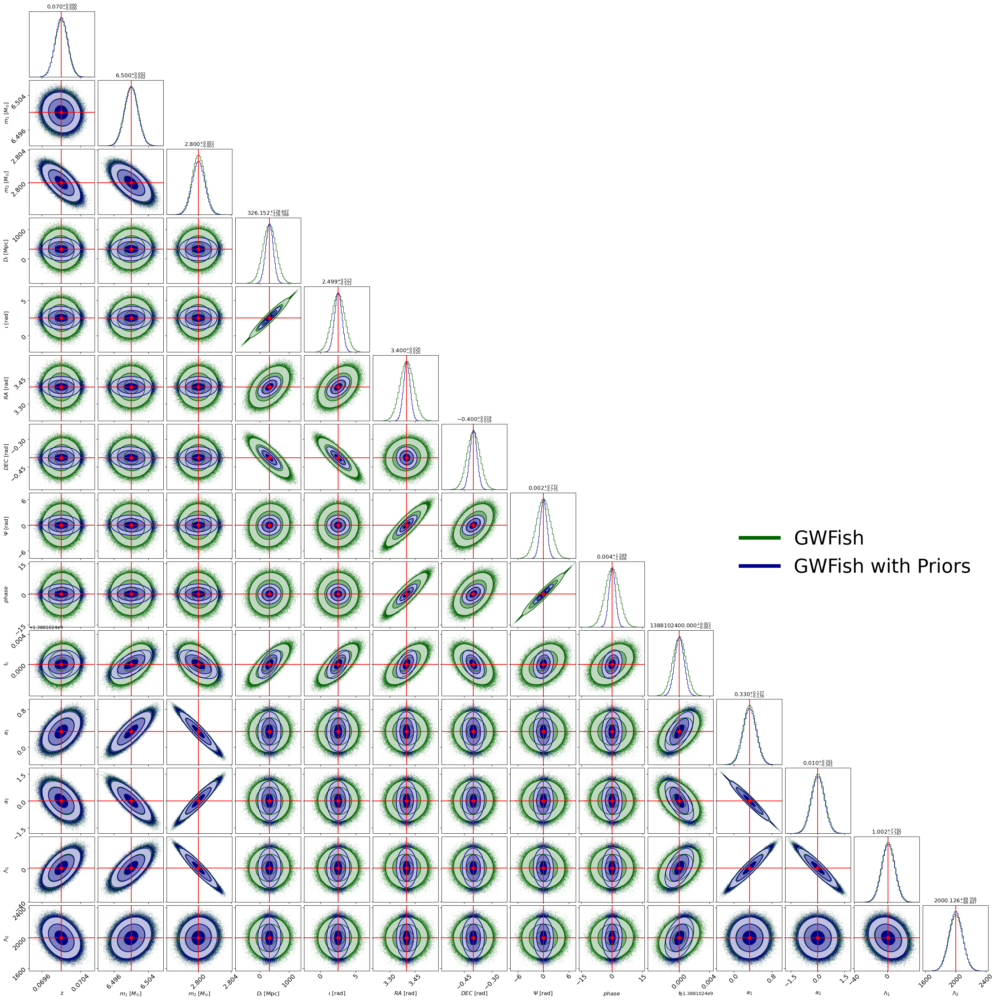

: 

In [15]:
import matplotlib.lines as mlines

samples_prior = np.random.multivariate_normal(mean_values, prior_cov_matrix, int(1e6))
colors = ['darkgreen','darkblue']                          
sample_labels = ['GWFish', 'GWFish with Priors']



fig = corner.corner(samples, labels = corner_labels, truths = mean_values, truth_color = 'red', color=colors[0],**CORNER_KWARGS)
fig = corner.corner(samples_prior, fig = fig,  truths=mean_values, truth_color = 'red', color = colors[1], **CORNER_KWARGS)

for ax in fig.get_axes():
    ax.tick_params(axis = 'both', which = 'major', labelsize = 14, pad = 0.1)
    plt.legend(
        handles = [
            mlines.Line2D([], [], linewidth=8, color=colors[i], label = sample_labels[i])
            for i in range(2)
        ],
        fontsize = 42, frameon = False,
        bbox_to_anchor = (1, 7), loc = "upper right"
    )
plt.show()

#### 3) Parameters sub sample  

In [20]:
corner_labels_reduct = [r'$m_1$ $[M_{\odot}]$', '$m_2$ $[M_{\odot}]$', '$D_l$ [Mpc]','$DEC$ [rad]', '$RA$ [rad]', '$a_1$', '$a_2$', '$\Lambda_1$', '$\Lambda_2$']

mean_labels_reduct = ['mass_1', 'mass_2', 'luminosity_distance','dec', 'ra', 'a_1', 'a_2', 'lambda_1', 'lambda_2']


#------------------ I can take the means from the reference parameters or from error file ------------------------

mean_values_reduct = NSBH_parameters[mean_labels_reduct].iloc[0] # mean values of the parameters

#means1=errors1[mean_lbs].iloc[0]

#------------------------------- take a submatrix of the covariant matrix ---------------------------------------
index_list=[]
for new_param in mean_labels_reduct:
    for param in fisher_NSBH_parameters:
        if param==new_param:
            index=fisher_NSBH_parameters.index(param)
            index_list.append(index)
            
cov_matrix_reduct= np.load(single_events_path + '/' + 'inv_fisher_matrices_ET_NSBH_SNR8.npy')[0, index_list,:]
cov_matrix_reduct=cov_matrix_reduct[:,index_list]
print(len(cov_matrix_reduct))

#----------------------------------------------------------------------------------------------------------------

# Sample from a multi-variate gaussian with the given covariance matrix and injected mean values
samples_reduct= np.random.multivariate_normal(mean_values_reduct, cov_matrix_reduct, int(1e6))

9


### Plot

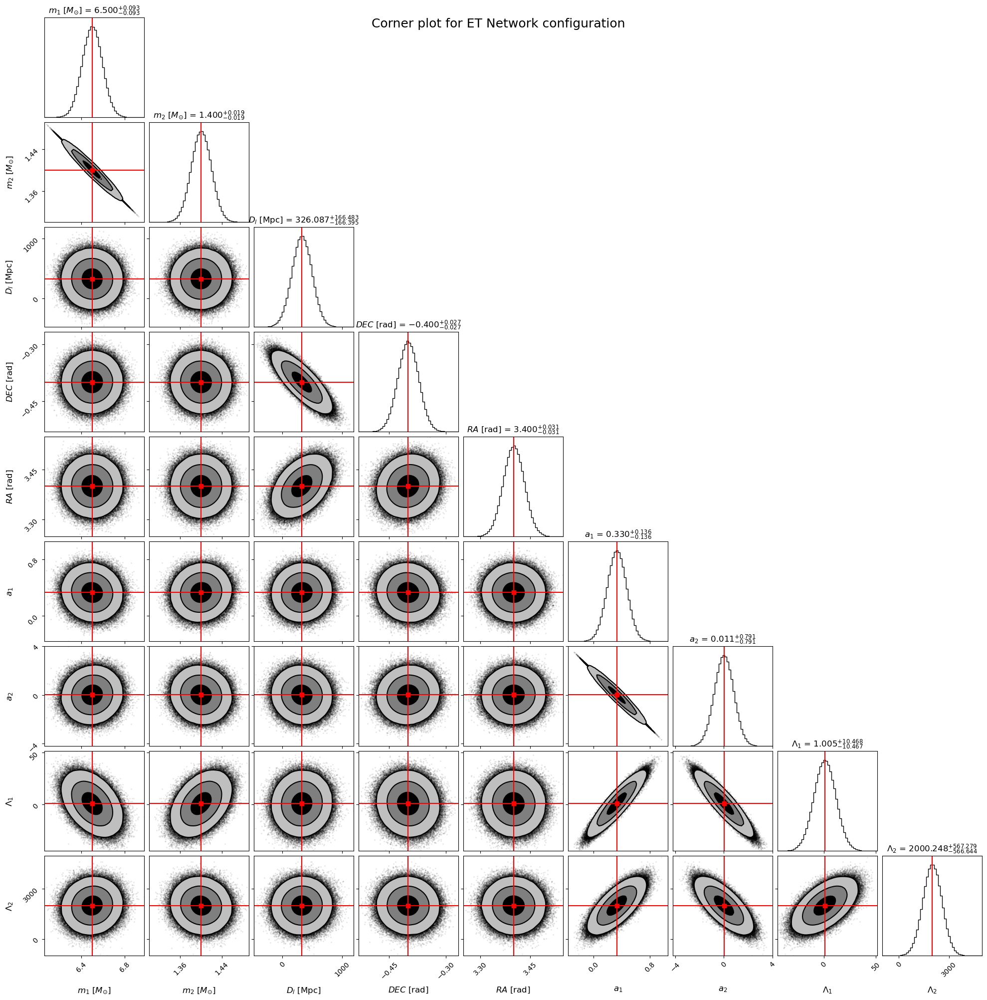

In [23]:
fig = corner.corner(samples_reduct, labels = corner_labels_reduct, truths = mean_values_reduct, truth_color = 'red', **CORNER_KWARGS)
fig.suptitle("Corner plot for ET Network configuration",fontsize=18)
plt.show()

#### 4) Parameters sub sample + priors

In [21]:
prior_cov_matrix_reduct= prior_cov_matrix[ index_list,:]
prior_cov_matrix_reduct=prior_cov_matrix_reduct[:,index_list]
print(len(prior_cov_matrix_reduct))

samples_prior_reduct = np.random.multivariate_normal(mean_values_reduct, prior_cov_matrix_reduct, int(1e6))

9


### Plot

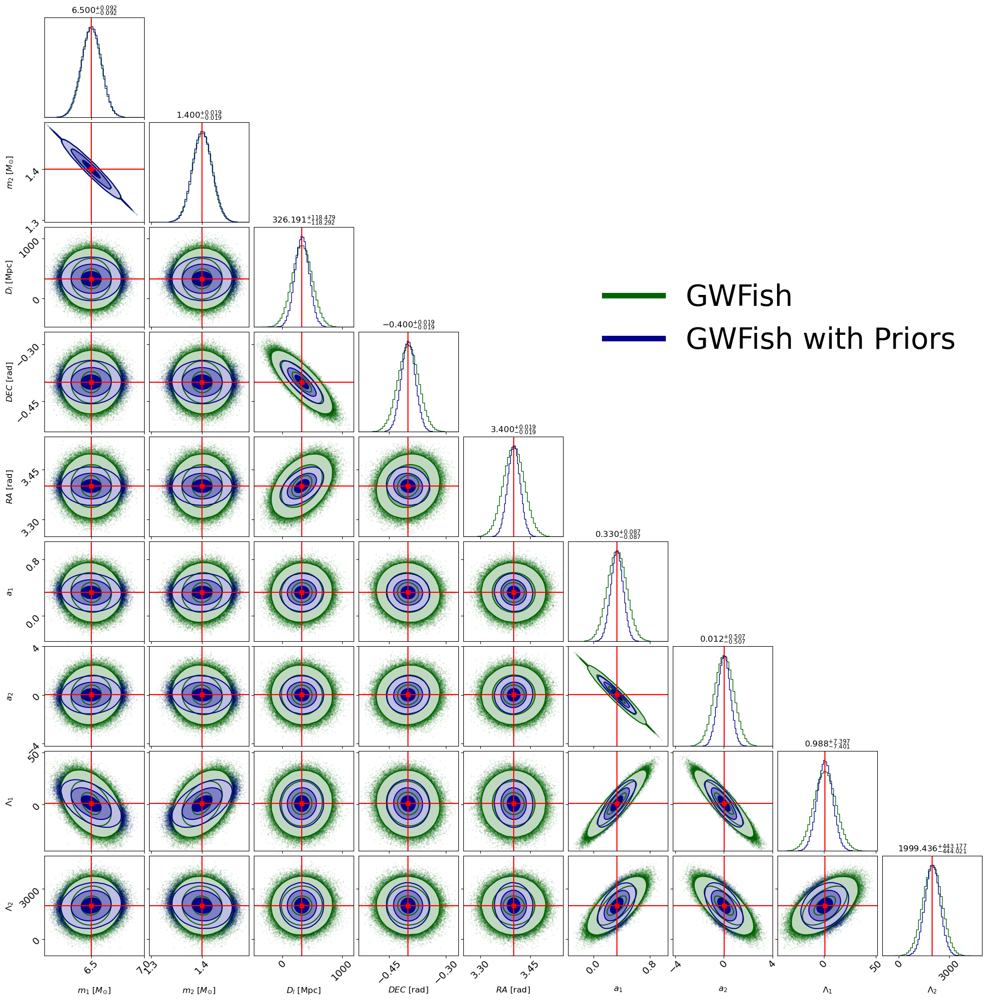

In [22]:
import matplotlib.lines as mlines

#colors= plt.colormaps['viridis'](np.linspace(0.6, 0.95, 2))

colors = ['darkgreen','darkblue']                          
sample_labels = ['GWFish', 'GWFish with Priors']


fig = corner.corner(samples_reduct, labels = corner_labels_reduct, truths = mean_values_reduct, truth_color = 'red', color=colors[0],**CORNER_KWARGS)
fig = corner.corner(samples_prior_reduct, fig = fig,  truths=mean_values_reduct, truth_color = 'red', color = colors[1], **CORNER_KWARGS)

#-------------------------------------------------------------------------------------------------------------------------------

for ax in fig.get_axes():
    ax.tick_params(axis = 'both', which = 'major', labelsize = 14, pad = 0.1)

plt.legend(
        handles = [
            mlines.Line2D([], [], linewidth=8, color=colors[i], label = sample_labels[i])
            for i in range(2)
        ],
        fontsize = 42, frameon = False,
        bbox_to_anchor = (1, 7), loc = "upper right"
    )
plt.show()